In [1]:
# New start 15/07/2022
%load_ext autoreload
%autoreload 2
import ObjectiveFunction as of
import numpy as np
import helper_funcs as hf
from math import sqrt
from scipy.stats import uniform, norm
from torch.optim.optimizer import Optimizer, required
import torch
import plotly.express as px
from typing import List, Optional
#torch.set_default_tensor_type('torch.cuda.FloatTensor')

In [2]:
def run_experiment(model, opt_alg, start, bounds, opt_params, n_epochs):
    m = model(start=start, bounds=bounds)
    
    if opt_alg is torch.optim.Adam or opt_alg is torch.optim.SGD:
            opt_problem = of.OptimisationProblem(
                m,
                opt_alg(params=m.parameters(), **opt_params),
                n_epochs = n_epochs
            )
    else:
        opt_problem = of.OptimisationProblem(
            m,
            opt_alg(params=m.parameters(), func=m, **opt_params),
            n_epochs = n_epochs
        )

    losses, params, preds = opt_problem.run()
    fig1 = opt_problem.visualise((-bounds, bounds), (-bounds, bounds), 0.1, render="contour")
    fig2 = hf.create_density_plot(params)
    if hasattr(opt_problem.opt, 'alpha_record'):
        fig3 = px.scatter(opt_problem.opt.alpha_record)
        return [fig1, fig2, fig3]
    
    else:
        return [fig1, fig2]


def powlaw_samp(x_min, alpha, size=1):
    """
    Samples from powerlaw dist with min value x_min.
    """
    r = np.random.random(size=size)
    return  x_min * (1 - r) ** (1 / (1-alpha))

    # https://stats.stackexchange.com/questions/173242/random-sample-from-power-law-distribution
    # https://arxiv.org/pdf/0706.1062.pdf

In [7]:
class SGD_TC2_5(Optimizer):

    def __init__(self,
                 params,
                 func: float = required,
                 lr: float = required,
                 height: float = required,
                 width: float = required,
                 momentum: float = 0
    ):
        self.record = {'lr': lr, 'height': height, 'width': width, 'momentum': momentum}
        self.alpha_record = []
        self.height = height
        self.width_denom = -0.5*(1/width)**2    # how large our count regions are
        self.step_count = 0
        self.alpha = 2.5

        self.func = func
        defaults = dict(lr=lr,
                        momentum=momentum)
        super().__init__(params, defaults)
    
    def _metric(self, pred):

        if not self.state:
            return pred
        
        history = self.state['history'][0:-1]
        last_ph = self.state['history'][-1]
        
        Vbias = 0

        for ph in history:
            v = last_ph - ph
            Vbias += torch.exp(self.width_denom * torch.dot(v, v.T))
        
        Vbias = self.height * Vbias

        # update detachment of tensors
        self.state['history'][-1] = self.state['history'][-1].detach().clone()

        # Adapt alpha - no phase preference
        self.adapt_alpha(Vbias, pred)
        
        return pred
    
    def adapt_alpha(self, Vbias, pred):

        p = float(Vbias/self.step_count)
        self.alpha = 2.5 + p

    @torch.no_grad()
    def step(self, closure=None):

        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            for p in group['params']:
                
                grad = p.grad
                
                if 'history' not in self.state:
                    self.state['history'] = [p]
                else:
                    self.state['history'].append(p)

                if 'momentum_buffer' not in self.state:
                    self.state['momentum_buffer'] = grad.detach().clone()
                else:
                    self.state['momentum_buffer'].mul_(group['momentum']).add_(grad, alpha=1)
                
                mom_grad = self.state['momentum_buffer']
                p.add_(mom_grad, alpha=-group['lr'])

                # Levy Flight noise
                levy_r = float(powlaw_samp(x_min=1, alpha=self.alpha)) #* torch.norm(grad)
                theta = float(uniform.rvs(loc=0, scale=2*np.pi))
                dir = np.array([np.cos(theta), np.sin(theta)])
                levy_noise = levy_r * torch.Tensor(dir)
                p.add_(levy_noise, alpha=-group['lr'])
                self.alpha_record.append(self.alpha)
                
                # Periodic Boundary Conditions (INBUILT TO OPTIMISER TO ENSURE COORDINATES ARE BOUNDED)
                p = self.func.apply_period(p)

        self.step_count += 1

        return loss

In [9]:
bounds = 10
n_epochs = 3000
figs = run_experiment(of.AlpineN1, SGD_TC2_5, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 0.01, 'momentum': 0.96, 'height': 1, 'width': bounds/10},
                      n_epochs=n_epochs
                      )
figs.extend(run_experiment(of.Ackley, SGD_TC2_5, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 0.003, 'momentum': 0.96, 'height': 1, 'width': bounds/10},
                      n_epochs=n_epochs
                      )
            )
figs.extend(run_experiment(of.Rosenbrock, SGD_TC2_5, start=[0.5,-1.5], bounds=3,
                      opt_params={'lr': 0.001, 'momentum': 0.96, 'height': 1, 'width': bounds/10},
                      n_epochs=n_epochs
                      )
            )
hf.figures_to_html(figs, 'TC2_5_results_n4.html')

0
300
600
900
1200
1500
1800
2100
2400
2700
0
300
600
900
1200
1500
1800
2100
2400


KeyboardInterrupt: 

In [41]:
bounds = 10
n_epochs = 3000
figs = run_experiment(of.AlpineN1, torch.optim.Adam, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 0.01},
                      n_epochs=n_epochs
                      )
figs.extend(run_experiment(of.Ackley, torch.optim.Adam, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 0.001},
                      n_epochs=n_epochs
                      )
            )
figs.extend(run_experiment(of.Rosenbrock, torch.optim.Adam, start=[0.5,-1.5], bounds=3,
                      opt_params={'lr': 0.001},
                      n_epochs=n_epochs
                      )
            )
hf.figures_to_html(figs, 'ADAM_results_n4.html')

0
300
600
900
1200
1500
1800
2100
2400
2700


KeyboardInterrupt: 

In [55]:
"Same as TC2_5 but vectorised Vbias calculation, WORK ON THIS DURING EXPERIMENTS - want faster in general"
# OR - fractal time period annealing
# 1500 + 750 + 375 + 187 + 93 + 46 + 23
class SGD_TC2_5v(Optimizer):

    def __init__(self,
                 params,
                 n_epochs: int,
                 func: float = required,
                 lr: float = required,
                 height: float = required,
                 width: float = required,
                 momentum: float = 0,
    ):
        self.record = {'lr': lr, 'height': height, 'width': width, 'momentum': momentum}
        self.alpha_record = []
        self.height = height
        self.width_denom = -0.5*(1/width)**2    # how large our count regions are
        self.step_count = 0
        self.alpha = 2.5
        self.anneal_count = n_epochs//2

        self.func = func
        defaults = dict(lr=lr,
                        momentum=momentum)
        super().__init__(params, defaults)
    
    def _metric(self, pred):

        if not self.state:
            return pred
        
        Vbias = self.compute_Vbias()

        # update detachment of tensors
        self.state['history'][-1] = self.state['history'][-1].detach().clone()

        # Adapt alpha - no phase preference
        self.adapt_alpha(Vbias, pred)

        # Anneal time period
        print(self.step_count, self.anneal_count, len(self.state['history']))
       
        if self.step_count == self.anneal_count:

            self.anneal_count = self.anneal_count//2
            self.step_count = 0
            self.state['history'] = [] if self.anneal_count > 20 else self.state['history'] # stop deleting
        
        return pred
    
    def compute_Vbias(self):
        
        history = self.state['history'][0:-1]
        last_ph = self.state['history'][-1]
        
        Vbias = 0
        for ph in history:
            v = last_ph - ph
            Vbias += torch.exp(self.width_denom * torch.dot(v, v.T))
        
        return float(self.height * Vbias)

    def adapt_alpha(self, Vbias, pred):

        p = Vbias/self.anneal_count
        self.alpha = 2.5 + p

    @torch.no_grad()
    def step(self, closure=None):

        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            for p in group['params']:
                
                grad = p.grad
                
                if 'history' not in self.state:
                    self.state['history'] = [p]
                else:
                    self.state['history'].append(p)

                if 'momentum_buffer' not in self.state:
                    self.state['momentum_buffer'] = grad.detach().clone()
                else:
                    self.state['momentum_buffer'].mul_(group['momentum']).add_(grad, alpha=1)
                
                mom_grad = self.state['momentum_buffer']
                p.add_(mom_grad, alpha=-group['lr'])

                # Levy Flight noise
                levy_r = float(powlaw_samp(x_min=1, alpha=self.alpha)) * torch.norm(grad)
                theta = float(uniform.rvs(loc=0, scale=2*np.pi))
                dir = np.array([np.cos(theta), np.sin(theta)])
                levy_noise = levy_r * torch.Tensor(dir)
                p.add_(levy_noise, alpha=-group['lr'])
                self.alpha_record.append(self.alpha)
                
                # Periodic Boundary Conditions (INBUILT TO OPTIMISER TO ENSURE COORDINATES ARE BOUNDED)
                p = self.func.apply_period(p)

        self.step_count += 1

        return loss

In [26]:
# TESTING *FASTER* FRACTAL ANNEALING IN TC2_5
bounds = 10
n_epochs = 3000
figs = run_experiment(of.AlpineN1, SGD_TC2_5v, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 0.1, 'momentum': 0.96, 'height': 1, 'width': bounds/10,
                      'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
figs.extend(run_experiment(of.Ackley, SGD_TC2_5v, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 0.1, 'momentum': 0.96, 'height': 1, 'width': bounds/10,
                      'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
            )
figs.extend(run_experiment(of.Rosenbrock, SGD_TC2_5v, start=[0.5,-1.5], bounds=3,
                      opt_params={'lr': 0.1, 'momentum': 0.96, 'height': 1, 'width': bounds/10,
                      'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
            )
hf.figures_to_html(figs, 'TC2_5_results_n4.html')

before Parameter containing:
tensor([2.5000, 2.0000], requires_grad=True)
after Parameter containing:
tensor([2.5000, 2.0000], requires_grad=True)
before Parameter containing:
tensor([2.6288, 2.1469], requires_grad=True)
after Parameter containing:
tensor([2.6288, 2.1469], requires_grad=True)
0
before Parameter containing:
tensor([2.6288, 2.1469], requires_grad=True)
after Parameter containing:
tensor([2.6288, 2.1469], requires_grad=True)
1 1500 1
before Parameter containing:
tensor([2.9833, 2.3936], requires_grad=True)
after Parameter containing:
tensor([2.9833, 2.3936], requires_grad=True)
before Parameter containing:
tensor([2.9833, 2.3936], requires_grad=True)
after Parameter containing:
tensor([2.9833, 2.3936], requires_grad=True)
2 1500 2
before Parameter containing:
tensor([3.7668, 2.2719], requires_grad=True)
after Parameter containing:
tensor([3.7668, 2.2719], requires_grad=True)
before Parameter containing:
tensor([3.7668, 2.2719], requires_grad=True)
after Parameter containi

In [ ]:
"""
TC2_5_results_n1
    - lr too high means function just goes everywhere
    - there appears to be critical lr's that work well
    - p forgetful due to step_count going up

TC2_5_results_n2
    - width from bounds/50 to bounds/10

TC2_5_results_n3
    - finding good lr for ackley and rosenbrock
    - height = 3 for alpine - test increase memory sensitivity

TC2_5_results_n4
    - ackley stuck due to low learning rate - try removing multiple of gradient levy noise
    - 
"""


In [36]:
class SGD_TC2_5v(Optimizer):

    def __init__(self,
                 params,
                 n_epochs: int,
                 func: float = required,
                 lr: float = required,
                 height: float = required,
                 width: float = required,
                 momentum: float = 0,
    ):
        self.record = {'lr': lr, 'height': height, 'width': width, 'momentum': momentum}
        self.alpha_record = []
        self.height = height
        self.width_denom = -0.5*(1/width)**2
        self.step_count = 0
        self.alpha = 2.5
        self.anneal_count = n_epochs//2

        self.func = func
        defaults = dict(lr=lr,
                        momentum=momentum)
        super().__init__(params, defaults)
    
    def _metric(self, pred):

        if not self.state:
            return pred
        
        Vbias = self.compute_Vbias()

        # update detachment of tensors
        self.state['history'][-1] = self.state['history'][-1].detach().clone()

        # Adapt alpha - no phase preference
        self.adapt_alpha(Vbias, pred)

        # Anneal time period
        print(self.step_count, self.anneal_count, len(self.state['history']))
       
        if self.step_count == self.anneal_count:
            self.anneal_count = self.anneal_count//2 if self.anneal_count > 20 else self.anneal_count
            self.step_count = 0
            self.state['history'] = [] if self.anneal_count > 20 else self.state['history'] # stop deleting
        
        return pred
    
    def compute_Vbias(self):
        
        history = self.state['history'][0:-1]
        last_ph = self.state['history'][-1]
        
        Vbias = 0
        for ph in history:
            v = last_ph - ph
            Vbias += torch.exp(self.width_denom * torch.dot(v, v.T))
        
        return float(self.height * Vbias)

    def adapt_alpha(self, Vbias, pred):
        p = Vbias/self.anneal_count
        self.alpha = 2.5 + p

    @torch.no_grad()
    def step(self, closure=None):

        loss = None
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            for p in group['params']:
                
                grad = p.grad
                
                if 'history' not in self.state:
                    self.state['history'] = [p]
                else:
                    self.state['history'].append(p)

                if 'momentum_buffer' not in self.state:
                    self.state['momentum_buffer'] = grad.detach().clone()
                else:
                    self.state['momentum_buffer'].mul_(group['momentum']).add_(grad, alpha=1)
                
                mom_grad = self.state['momentum_buffer']
                p.add_(mom_grad, alpha=-group['lr'])

                # Levy Flight noise
                levy_r = float(powlaw_samp(x_min=1, alpha=self.alpha)) * torch.norm(grad)
                theta = float(uniform.rvs(loc=0, scale=2*np.pi))
                dir = np.array([np.cos(theta), np.sin(theta)])
                levy_noise = levy_r * torch.Tensor(dir)
                p.add_(levy_noise, alpha=-group['lr'])
                self.alpha_record.append(self.alpha)
                
                # Periodic Boundary Conditions (INBUILT TO OPTIMISER TO ENSURE COORDINATES ARE BOUNDED)
                p = self.func.apply_period(p)

        self.step_count += 1

        return loss

class SGD_TC3v(SGD_TC2_5v):
    """
    Trying to solve the LR problem.
    """
    def __init__(self,
                 params,
                 n_epochs: int,
                 func: float = required,
                 lr: float = required,
                 height: float = required,
                 width: float = required,
                 momentum: float = 0,
    ):
        super().__init__(params, n_epochs, func, lr, height, width, momentum)
        self.anneal_count = n_epochs
    
    def _metric(self, pred):

        if not self.state:
            return pred
        
        Vbias = self.compute_Vbias()

        # update detachment of tensors
        self.state['history'][-1] = self.state['history'][-1].detach().clone()

        # Adapt alpha - no phase preference
        self.adapt_alpha(Vbias, pred)

        # Adapt lr
        self.adapt_lr(Vbias, pred)

        # Annealing TC has been removed compared to 2_5v
        
        return pred
    
    def adapt_lr(self, Vbias, pred):
        # Use the ADAM scheme here?
        # Use Vbias to adapt the lr as well? --> increase SGD and decrease Levy motion (potential well effect)
        print(self.state['history'][-1], pred)
        for group in self.param_groups:
            self.effective_lr = group['lr'] * np.exp(-0.1*Vbias)
            # NB - this currently only works on one parameter set
        
    @torch.no_grad()
    def step(self, closure=None):

        loss = None    
        if closure is not None:
            with torch.enable_grad():
                loss = closure()

        for group in self.param_groups:
            for p in group['params']:
                
                grad = p.grad
                
                if 'history' not in self.state:
                    self.state['history'] = [p]
                else:
                    self.state['history'].append(p)

                if 'momentum_buffer' not in self.state:
                    self.state['momentum_buffer'] = grad.detach().clone()
                else:
                    self.state['momentum_buffer'].mul_(group['momentum']).add_(grad, alpha=1)
                
                if not hasattr(self, 'effective_lr'):
                    self.effective_lr = group['lr']

                mom_grad = self.state['momentum_buffer']
                p.add_(mom_grad, alpha=-self.effective_lr)

                # Levy Flight noise
                # levy_r = float(powlaw_samp(x_min=1, alpha=self.alpha)) * torch.norm(grad)
                # theta = float(uniform.rvs(loc=0, scale=2*np.pi))
                # dir = np.array([np.cos(theta), np.sin(theta)])
                # levy_noise = levy_r * torch.Tensor(dir)
                # p.add_(levy_noise, alpha=-self.effective_lr)
                self.alpha_record.append(self.alpha)
                
                # Periodic Boundary Conditions (INBUILT TO OPTIMISER TO ENSURE COORDINATES ARE BOUNDED)
                p = self.func.apply_period(p)

        self.step_count += 1

        return loss

In [40]:
bounds = 10
n_epochs = 400
figs = run_experiment(of.AlpineN1, SGD_TC3v, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 1, 'momentum': 0, 'height': 1, 'width': bounds/10, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                     )
figs.extend(run_experiment(of.Ackley, SGD_TC3v, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 1, 'momentum': 0, 'height': 1, 'width': bounds/10, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
            )
figs.extend(run_experiment(of.Rosenbrock, SGD_TC3v, start=[0.5,-1.5], bounds=bounds,
                      opt_params={'lr': 1, 'momentum': 0, 'height': 1, 'width': bounds/10, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
            )   
hf.figures_to_html(figs, 'TC3v_test_nolevy.html')

0
tensor([3.8044, 1.8230]) tensor(3.9081, grad_fn=<SumBackward0>)
tensor([0.2902, 1.2095]) tensor(1.3644, grad_fn=<SumBackward0>)
tensor([-0.3739, -0.2532]) tensor(0.1373, grad_fn=<SumBackward0>)
tensor([0.2227, 0.1317]) tensor(0.1019, grad_fn=<SumBackward0>)
tensor([-0.2481, -0.1849]) tensor(0.0516, grad_fn=<SumBackward0>)
tensor([0.0627, 0.0289]) tensor(0.0139, grad_fn=<SumBackward0>)
tensor([-0.0997, -0.0849]) tensor(0.0013, grad_fn=<SumBackward0>)
tensor([-0.1642, -0.1302]) tensor(0.0143, grad_fn=<SumBackward0>)
tensor([-0.0300, -0.0356]) tensor(0.0044, grad_fn=<SumBackward0>)
tensor([-0.0086, -0.0202]) tensor(0.0024, grad_fn=<SumBackward0>)
tensor([0.0315, 0.0087]) tensor(0.0051, grad_fn=<SumBackward0>)
tensor([-0.0401, -0.0428]) tensor(0.0049, grad_fn=<SumBackward0>)
tensor([-0.0321, -0.0371]) tensor(0.0045, grad_fn=<SumBackward0>)
tensor([-0.0193, -0.0279]) tensor(0.0036, grad_fn=<SumBackward0>)
tensor([ 0.0006, -0.0136]) tensor(0.0012, grad_fn=<SumBackward0>)
tensor([-0.0291,  

In [14]:
bounds = 10
n_epochs = 400
lr = 0.05 # ADAM default
n_epochs = 1000
figs = run_experiment(of.AlpineN1, torch.optim.Adam, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': lr},
                      n_epochs=n_epochs
                      )
figs.extend(run_experiment(of.Ackley, torch.optim.Adam, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': lr},
                      n_epochs=n_epochs
                      )
            )
figs.extend(run_experiment(of.Rosenbrock, torch.optim.Adam, start=[0.5,-1.5], bounds=3,
                      opt_params={'lr': lr},
                      n_epochs=n_epochs
                      )
            )
hf.figures_to_html(figs, 'ADAM_test_defaultlr.html')

0
100
200
300
400
500
600
700
800
900
0
100
200
300
400
500
600
700
800
900
0
100
200
300
400
500
600
700
800
900


In [214]:
from PSGD import PSGD
bounds = 10
n_epochs = 400
figs = run_experiment(of.AlpineN1, PSGD, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 1, 'momentum': 0.9,},
                      n_epochs=n_epochs
                      )
figs.extend(run_experiment(of.Ackley, PSGD, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 1, 'momentum': 0.9,},
                      n_epochs=n_epochs
                      )
            )
figs.extend(run_experiment(of.Rosenbrock, PSGD, start=[0.5,-1.5], bounds=3,
                      opt_params={'lr': 1, 'momentum': 0.9,},
                      n_epochs=n_epochs
                      )
            )
hf.figures_to_html(figs, 'SGD_test.html')

[autoreload of SGD_TC failed: Traceback (most recent call last):
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 410, in superreload
    update_generic(old_obj, new_obj)
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 347, in update_generic
    update(a, b)
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 302, in update_class
    if update_generic(old_obj, new_obj): continue
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 347, in update_generic
    update(a, b)
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 266, in update_function
    setattr(old, nam

0
40
80
120
160
200
240
280
320
360
0
40
80
120
160
200
240
280
320
360
0
40
80
120
160
200
240
280
320
360


In [ ]:
"""
PARAMS THAT MATTER
- scale for levy stable dist
- height
- width
- xmin for power law,
- minimum alpha (look into relation to super/sub-diffusion)
- 
"""

In [18]:
from ADAM_TC import ADAM_TC
lr = 0.05 # ADAM default
betas = (0.99, 0.999)
bounds = 10
height = 1.1
width = bounds/20
n_epochs = 1000
figs = run_experiment(of.AlpineN1, ADAM_TC, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': lr, 'betas': betas,
                                  'height': height, 'width': width, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
figs.extend(run_experiment(of.Ackley, ADAM_TC, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': lr, 'betas': betas,
                                  'height': height, 'width': width, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
            )
figs.extend(run_experiment(of.Rosenbrock, ADAM_TC, start=[0.5,-1.5], bounds=3,
                      opt_params={'lr': lr, 'betas': betas,
                                  'height': height, 'width': width, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
            )
hf.figures_to_html(figs, 'ADAM_TC_gradmult_test.html')
# Last test --> just set alpha = 2 --> converges better
# adaptive alpha doesnt do shit
# all in the annealing schedule

# many hours later --> kinda happy with it
# still doesnt work independent of parameters
# lets do a ensemble of runs to comp expectation values

tensor([0.2236, 0.2236]) 0.6910067681319835 tensor([3.0903, 3.0903]) 0.9 4.999999999999996
0
tensor([0.1960, 0.1938]) 0.3838597889643328 tensor([1.9589, 1.9806]) 0.9000000000616541 2.5125628140703484
tensor([0.0465, 0.1946]) 0.1153067390346617 tensor([2.4784, 0.5925]) 0.9551510155200958 1.6834450018517908
tensor([0.1100, 0.1862]) 0.11493056522771326 tensor([1.0444, 0.6171]) 1.1991642951965331 1.2689070320036102
tensor([0.1430, 0.1691]) 0.33304454699771985 tensor([2.3294, 1.9691]) 1.3292338848114014 1.0202009979193982
tensor([0.1629, 0.1539]) 4.598623867522844 tensor([28.2272, 29.8870]) 0.9 0.8544109304485206
tensor([0.1508, 0.1524]) 0.5169957553336348 tensor([3.4273, 3.3918]) 0.900000000000006 0.7360014139992128
tensor([0.1414, 0.1328]) 0.13794234977772335 tensor([0.9753, 1.0389]) 1.0063973680138587 0.6472047405643814
tensor([0.1299, 0.1115]) 0.8104605541011223 tensor([6.2375, 7.2686]) 1.1103574673334757 0.5781499610635306
tensor([0.1252, 0.0713]) 1.17028235294593 tensor([ 9.3442, 16.4

In [45]:
from ADAM_TC import ADAM_TC
problem = of.AlpineN1
lr = 1 # currently ADAM default (lr + betas)
betas = (0.9, 0.999) 
bounds = 10
height = 1.5
width = bounds/20
n_epochs = 4000
figs = run_experiment(problem, ADAM_TC, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': lr, 'betas': betas,
                                  'height': height, 'width': width, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
# figs.extend(run_experiment(problem, ADAM_TC, start=[2.5,2], bounds=bounds,
#                       opt_params={'lr': lr, 'betas': betas,
#                                   'height': height, 'width': width, 'n_epochs': n_epochs},
#                       n_epochs=n_epochs
#                       )
#             )
# figs.extend(run_experiment(problem, ADAM_TC, start=[2.5,2], bounds=bounds,
#                       opt_params={'lr': lr, 'betas': betas,
#                                   'height': height, 'width': width, 'n_epochs': n_epochs},
#                       n_epochs=n_epochs
#                       )
#             )
hf.figures_to_html(figs, 'ADAM_TC_gradmult_test_ALPINEx3.html')

[autoreload of ADAM_TC failed: Traceback (most recent call last):
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 410, in superreload
    update_generic(old_obj, new_obj)
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 347, in update_generic
    update(a, b)
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 302, in update_class
    if update_generic(old_obj, new_obj): continue
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 347, in update_generic
    update(a, b)
  File "c:\Users\karls\anaconda3\envs\honours\lib\site-packages\IPython\extensions\autoreload.py", line 266, in update_function
    setattr(old, na

tensor(1.) 74.5872649068478 tensor(74.5873) 0.5
0
tensor(0.7071) 0.5080304130012926 tensor(0.7185) 0.5
tensor(0.8161) 6.139720841369456 tensor(7.5231) 0.5000000004954825
tensor(0.7003) 25.75876352909427 tensor(36.7803) 0.5000000018838531
tensor(0.7809) 16.77802703211984 tensor(21.4857) 0.5
tensor(0.5440) 4122.757361790239 tensor(7579.0635) 0.507637777676185
tensor(0.2435) 0.24093551692751627 tensor(0.9895) 0.5004649846149343
tensor(0.5066) 1.0005120096553228 tensor(1.9751) 0.6159478053450584
tensor(0.4897) 0.346978730544465 tensor(0.7085) 0.6145231061511569
tensor(0.5270) 5.972137516410626 tensor(11.3321) 0.549701863527298
tensor(0.3792) 1.6402820276815122 tensor(4.3253) 0.5194756849245592
tensor(0.4931) 77.2813410763609 tensor(156.7281) 0.5183235357205073
tensor(0.3555) 0.06433859528934592 tensor(0.1810) 0.5
tensor(0.4768) 0.346923656676844 tensor(0.7276) 0.5961914999144418
tensor(0.5805) 82.23403007352769 tensor(141.6689) 0.6854013442993164
tensor(0.5202) 0.28903837305873803 tensor(0

In [57]:
from SGD_TC import SGD_TC
bounds = 10
n_epochs = 600
figs = run_experiment(of.AlpineN1, SGD_TC, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 1, 'momentum': 0.9, 'height': 20, 'width': bounds/20, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
figs.extend(run_experiment(of.Ackley, SGD_TC, start=[2.5,2], bounds=bounds,
                      opt_params={'lr': 1, 'momentum': 0.9, 'height': 20, 'width': bounds/20, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
            )
figs.extend(run_experiment(of.Rosenbrock, SGD_TC, start=[0.5,-1.5], bounds=3,
                      opt_params={'lr': 1, 'momentum': 0.9, 'height': 20, 'width': bounds/20, 'n_epochs': n_epochs},
                      n_epochs=n_epochs
                      )
            )
hf.figures_to_html(figs, 'SGD_TC_test.html')

tensor(0.3075) 0
tensor(0.9178) tensor(0.6554) tensor(0.1031) tensor(0.3262) tensor(0.1405) tensor(0.1024) tensor(0.0173) tensor(0.1402) tensor(0.0245) tensor(0.0166) tensor(0.0427) tensor(0.0941) tensor(0.0423) tensor(0.5807) tensor(0.0809) tensor(0.5769) tensor(0.0120) tensor(0.0487) tensor(0.0152) tensor(1.4376) tensor(0.9126) tensor(0.0134) tensor(0.1184) tensor(0.0112) tensor(0.1957) tensor(0.0762) tensor(0.0641) tensor(0.0496) tensor(0.0876) tensor(0.0548) tensor(0.0110) tensor(0.0324) tensor(0.0381) tensor(0.1178) tensor(0.0893) tensor(0.0135) tensor(0.0131) tensor(0.0026) tensor(0.0159) tensor(0.0123) tensor(0.0024) tensor(0.0034) tensor(0.0164) tensor(0.0487) tensor(0.0785) tensor(0.0081) tensor(0.0259) tensor(0.0198) tensor(0.3265) tensor(0.0083) tensor(0.0156) tensor(0.3420) tensor(0.0056) tensor(0.0631) tensor(0.1109) tensor(0.0238) tensor(0.0181) tensor(0.0201) tensor(0.0140) tensor(0.0284) 60
tensor(0.0466) tensor(0.0610) tensor(0.0483) tensor(0.3337) tensor(0.0068) tenso

KeyboardInterrupt: 

In [7]:
# Setup linear regression problem and use optimiser to test
# See if it works + compare with ADAM and traditional SGD
x = torch.Tensor([1,1])
type(x.size(dim=0))

int

In [13]:
a = np.random.normal(size=2)
print(a)
print(a.sum(axis=0, keepdims=True))

[1.47168039 0.4606986 ]
[1.93237899]


In [40]:
a = np.random.normal(size=2)
a = np.sqrt(sum(a**2))**(-1) * a


[1.43395272 0.04439719]
[0.99952104 0.03094658]


In [47]:
def hypersphere_sample(dim):
    
    direction = np.random.normal(size=dim)
    direction = np.sqrt(sum(direction**2))**(-1) * direction
    
    return direction

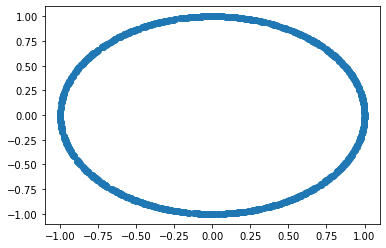

In [59]:
# Testing hypersphere_sample in 2d.
dim = 2
a = []
for i in range(1000):
    a.append(hypersphere_sample(dim))

import matplotlib.pyplot as plt
x,y = hf.nested_list_to_vectors(a)
plt.scatter(x,y)

In [118]:
x = torch.Tensor([8,-7])
x

tensor([ 8., -7.])

In [119]:
pof = of.PeriodicObjectiveFunction(start=1, bounds=10)
x = pof.pbc(x)
x

tensor([-2.,  3.])

In [120]:
b = 10
print(x)
x[x >= 0] = x[x>0] - b * torch.floor(x[x>0]/b + 0.5)
print(x)
x[x < 0] = x[x<0] - b * torch.ceil(x[x<0]/b - 0.5)
print(x)

tensor([-2.,  3.])
tensor([-2.,  3.])
tensor([-2.,  3.])


In [112]:
x[x>0]/b + 0.5

tensor([1.3000])

In [117]:
x[x>0] - b * torch.floor(x[x>0]/b + 0.5)

tensor([-2.])

In [88]:
"""
rvs(alpha, beta, loc=0, scale=1, size=1, random_state=None)
Random variates.
0 < alpha < 2, alpha = 2 (normal), alpha = 1 (cauchy)
alpha < 2 (undefined variance), alpha <= 1 (undefined mean)
beta = 0 (unskewed but symmetric about)
"""
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
from scipy.stats import levy_stable
import plotly.graph_objects as go

normal = levy_stable.rvs(1, 0, scale=0.01, size=100000)
between = levy_stable.rvs(1, 0, scale=0.1, size=100000)
cauchy = levy_stable.rvs(1, 0, scale=1, size=100000)

def cutoff(sample, end_set):
    return sample[abs(sample) < end_set]

normal, between, cauchy = cutoff(normal,20), cutoff(between,20), cutoff(cauchy,20)

fig = make_subplots(rows=3, cols=1)
fig.add_trace(
    go.Histogram(x=normal),
    row=1,col=1
)
fig.add_trace(
    go.Histogram(x=between),
    row=2,col=1
)
fig.add_trace(
    go.Histogram(x=cauchy),
    row=3,col=1
)

